# Initialization

In [1]:
import matplotlib.pyplot as plt
import xarray as xr

plt.rcParams['figure.figsize'] = [16, 3]

import sys
sys.path.append('/mnt/lustre/IAM851/jm1667/psc/python')
import psc

import logging
# logging.basicConfig(level=logging.DEBUG)

%config InlineBackend.figure_format = 'retina'
engine = "pscadios2"
species_names = ["e", "i"]

In [2]:
case = "case1-ion"
B = 1
res = 512
mods = "" # e.g. "_osc", ""

path = f"/mnt/lustre/IAM851/jm1667/psc-runs/{case}/trials/B{B}_n{res}{mods}/"
length = {1:(1., .03, .03), 10:(1., .02, .02), .1:(1., .18, .18)}[B]

## Plotting Demo 1

In [3]:
ds = xr.open_dataset(path + "pfd.000000000.bp", length=length, engine=engine, species_names=species_names)
print(ds._variables.keys())

dict_keys(['x', 'y', 'z', 'jx_ec', 'jy_ec', 'jz_ec', 'ex_ec', 'ey_ec', 'ez_ec', 'hx_fc', 'hy_fc', 'hz_fc'])


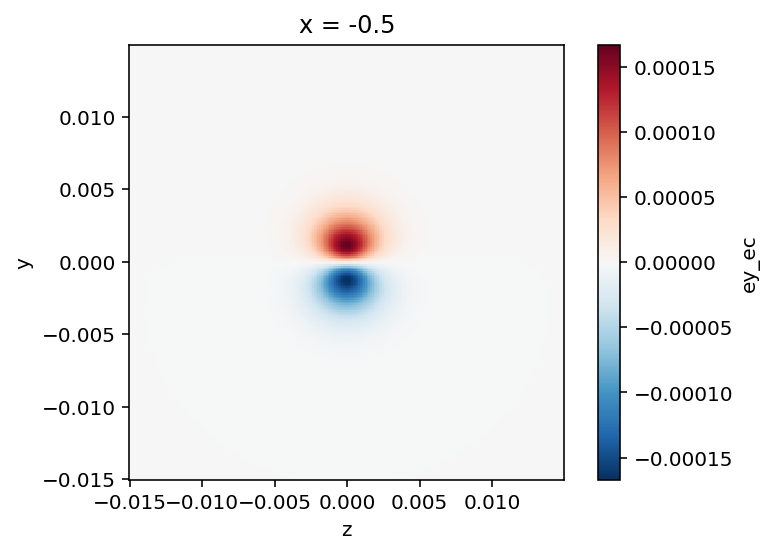

In [5]:
%matplotlib inline
# ds.jz_ec.sel(z=slice(0, 12)).coarsen(y=2, z=2).mean().plot()
# ds.hz_fc.coarsen(y=2, z=2).mean().plot()
ds.ey_ec.coarsen(y=2, z=2).mean().plot()
plt.gca().set_aspect('equal')

## Plotting Demo 2

In [11]:
moments = xr.open_dataset(path + "pfd_moments.000000000.bp", length=length, engine=engine)
print(moments._variables.keys())
print("t = ", moments._attrs['time'])

dict_keys(['x', 'y', 'z', 'rho_e', 'jx_e', 'jy_e', 'jz_e', 'px_e', 'py_e', 'pz_e', 'txx_e', 'tyy_e', 'tzz_e', 'txy_e', 'tyz_e', 'tzx_e', 'rho_i', 'jx_i', 'jy_i', 'jz_i', 'px_i', 'py_i', 'pz_i', 'txx_i', 'tyy_i', 'tzz_i', 'txy_i', 'tyz_i', 'tzx_i'])
t =  0.0


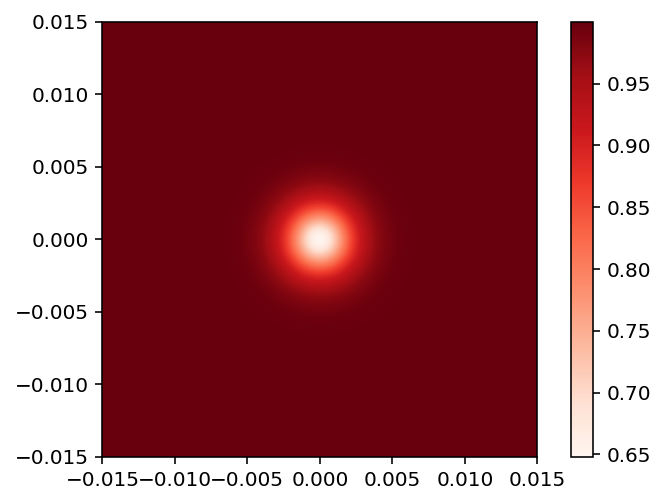

In [13]:
%matplotlib inline
fig, ax = plt.subplots()
data = moments.rho_i.coarsen(y=2, z=2).mean()[0,:,:].transpose()[:,::-1] # data is initially z>, yv; we want y>, z^
im = ax.imshow(data, cmap='Reds', extent=(-length[1]/2, length[1]/2, -length[2]/2, length[2]/2))
fig.colorbar(im, ax=ax)
plt.show()

# Animation
from https://stackoverflow.com/questions/18743673/show-consecutive-images-arrays-with-imshow-as-repeating-animation-in-python
and http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-notebooks/

In [20]:
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np

def openFile(fileName, step):
    return xr.open_dataset(path + f"{fileName}.{str(step).rjust(9,'0')}.bp", length=length, engine=engine, species_names=species_names)

def prepData(data):
    # data is initially z>, yv; we want y>, z^
#     return data.coarsen(y=2, z=2).mean()[0,:,:].transpose()[:,::-1]
    return data[0,:,:].transpose()[:,::-1]

def getDataAndTime(frameIdx):
    if frameIdx == 0 and param.skipFirst:
        frameIdx = 1
    file = openFile(param.fileName, frameIdx*stepsPerFrame)
    if isinstance(param.varName, list):
        return param.coef * sum(prepData(file.__getattr__(var)) ** 2 for var in param.varName) ** .5, file._attrs['time']
    return param.coef * prepData(file.__getattr__(param.varName)), file._attrs['time']

def setTitle(ax, param, time):
    ax.set_title(param.title + " (t={:.2f})".format(time))

class ParamMetadata:
    def __init__(self, title, vmin, vmax, colors, fileName, varName, coef=1, skipFirst=False):
        self.title = title
        self.vmin = vmin
        self.vmax = vmax
        self.colors = colors
        self.fileName = fileName
        self.varName = varName
        self.coef = coef
        self.skipFirst = skipFirst

In [21]:
nframes = 100

# determine number of steps in file (will fail if run ran out of time)
with open(path + "params_record.txt") as records:
    for line in records:
        if line.startswith("nmax"):
            nsteps = int(line.split()[1])

stepsPerFrame = nsteps // nframes

print(f"nsteps in sim: {nsteps}")
print(f"nframes in animation = {nframes}")
print(f"steps per frame: {stepsPerFrame}")

nsteps in sim: 1000000
nframes in animation = 100
steps per frame: 10000


In [22]:
paramId = 0
param = [
        ParamMetadata('Electron Density', 0, None, 'inferno', 'pfd_moments', 'rho_e', coef=-1),
#         ParamMetadata('Electron Density', 0, .25, 'Reds', 'pfd_moments', 'rho_e', coef=-1),
        ParamMetadata('Y-ial E', -.0005, .0005, 'RdBu', 'pfd', 'ey_ec'),
        ParamMetadata('Y-ial B', -3e-8, 3e-8, 'RdBu', 'pfd', 'hy_fc', skipFirst=True),
        ParamMetadata('X-ial B', -B*1.2, B*1.2, 'RdBu', 'pfd', 'hx_fc'),
        ParamMetadata('Y-ial J', -.0005, .0005, 'RdBu', 'pfd', 'jy_ec', skipFirst=True),
        ][paramId]

In [23]:
# load data
datas, times = [list(x) for x in zip(*[getDataAndTime(idx) for idx in range(nframes)])]
if param.skipFirst:
    del datas[0]
    del times[0]
    nframes -= 1

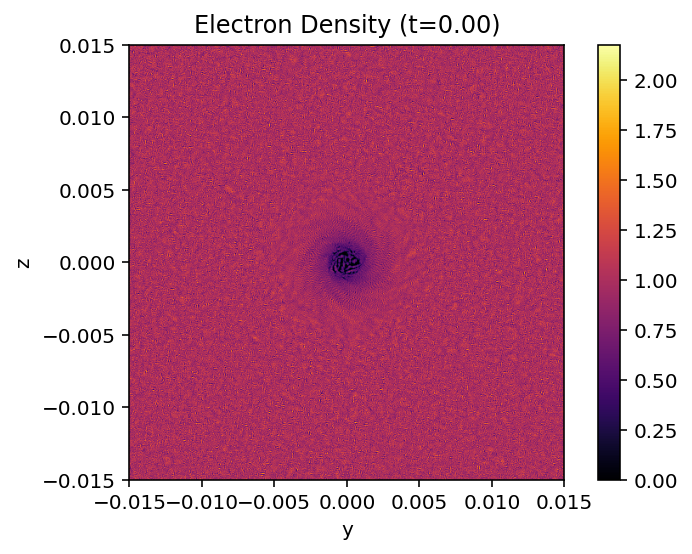

In [53]:
%matplotlib ipympl
fig, ax = plt.subplots()

im = ax.imshow(datas[-1], cmap=param.colors, vmin=param.vmin, vmax=param.vmax, extent=(-length[1]/2, length[1]/2, -length[2]/2, length[2]/2))
ax.set_xlabel('y')
ax.set_ylabel('z')
setTitle(ax, param, 0)
fig.colorbar(im, ax=ax);

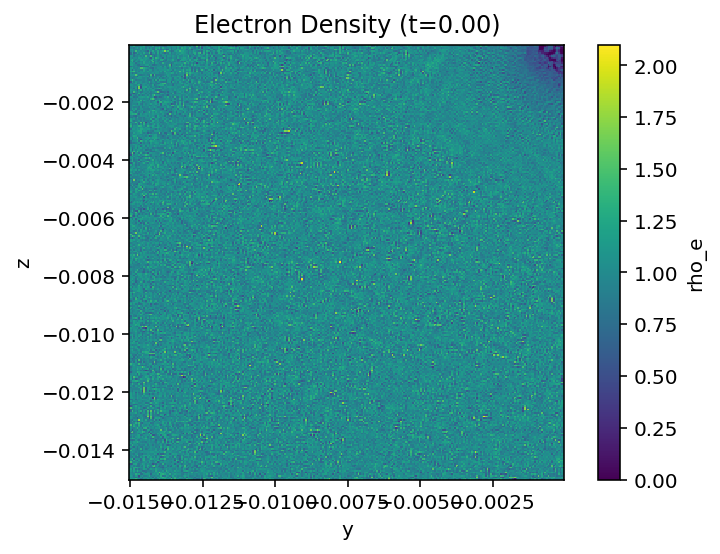

In [52]:
datas[-1][:256,256:].plot()
ax = plt.gca()
fig = plt.gcf()
setTitle(ax, param, 0)
ax.set_aspect('equal')

In [57]:
%matplotlib ipympl

def updateIm(frameIdx):
#     data, time = getDataAndTime(frameIdx)
    im.set_array(datas[frameIdx])
    setTitle(ax, param, times[frameIdx])
    return [im]

anim = animation.FuncAnimation(fig, updateIm, interval=30, frames=nframes, repeat=False, blit=True)
HTML(anim.to_html5_video())

## Stability Plot

In [58]:
%matplotlib ipympl
def norm(x):
    return xr.apply_ufunc(np.linalg.norm, x, input_core_dims=[['y', 'z']])

normsOfDiffs = [norm(data - datas[0]) for data in datas]

plt.xlabel("Time")
plt.ylabel("2-Norm of Difference")
plt.title("Stability of " + param.title)

plt.plot(times, normsOfDiffs)
plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …